In [65]:
#Import dependencies
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics
import seaborn as sns
from sklearn.metrics import confusion_matrix
#Imports for graphcs
from sklearn.tree import export_graphviz
from io import StringIO
from IPython.display import Image
import pydotplus
######NOTE FOR MONIQUE: YOU AR ON THE VISUALIZING PORTION FOR ITERATION 000


In [66]:
#Iteration 000: First Decision tree based upon data

In [67]:
#Exploratory Data Analysis

#Read dataframe
data = pd.read_csv("./bodyPerformance.csv")
data.head(5)

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,M,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,C
1,25.0,M,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,A
2,31.0,M,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,C
3,32.0,M,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,B
4,28.0,M,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,B


In [68]:
#describe the data
data.describe()

,age,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm
count,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000,13393.000000
mean,36.775106,168.559807,67.447316,23.240165,78.796842,130.234817,36.963877,15.209268,39.771224,190.129627
std,13.625639,8.426583,11.949666,7.256844,10.742033,14.713954,10.624864,8.456677,14.276698,39.868000
min,21.000000,125.000000,26.300000,3.000000,0.000000,0.000000,0.000000,-25.000000,0.000000,0.000000
25%,25.000000,162.400000,58.200000,18.000000,71.000000,120.000000,27.500000,10.900000,30.000000,162.000000
50%,32.000000,169.200000,67.400000,22.800000,79.000000,130.000000,37.900000,16.200000,41.000000,193.000000
75%,48.000000,174.800000,75.300000,28.000000,86.000000,141.000000,45.200000,20.700000,50.000000,221.000000
max,64.000000,193.800000,138.100000,78.400000,156.200000,201.000000,70.500000,213.000000,80.000000,303.000000


In [69]:
#preprocessing
#drop all null values from data
data = data.dropna()
#data encoding - convert all string columns to floats
label_encoder = preprocessing.LabelEncoder()
data['gender'] = label_encoder.fit_transform(data['gender'])
data['class'] = label_encoder.fit_transform(data['class'])

In [70]:
#reprint dataset
data.head(5)

,age,gender,height_cm,weight_kg,body fat_%,diastolic,systolic,gripForce,sit and bend forward_cm,sit-ups counts,broad jump_cm,class
0,27.0,1,172.3,75.24,21.3,80.0,130.0,54.9,18.4,60.0,217.0,2
1,25.0,1,165.0,55.80,15.7,77.0,126.0,36.4,16.3,53.0,229.0,0
2,31.0,1,179.6,78.00,20.1,92.0,152.0,44.8,12.0,49.0,181.0,2
3,32.0,1,174.5,71.10,18.4,76.0,147.0,41.4,15.2,53.0,219.0,1
4,28.0,1,173.8,67.70,17.1,70.0,127.0,43.5,27.1,45.0,217.0,1


                              age    gender  height_cm  weight_kg  body fat_%  \
age                      1.000000 -0.060229  -0.293980  -0.099966    0.242302   
gender                  -0.060229  1.000000   0.730899   0.672887   -0.551407   
height_cm               -0.293980  0.730899   1.000000   0.734909   -0.515440   
weight_kg               -0.099966  0.672887   0.734909   1.000000   -0.084065   
body fat_%               0.242302 -0.551407  -0.515440  -0.084065    1.000000   
diastolic                0.158508  0.228552   0.145933   0.262317    0.048059   
systolic                 0.211167  0.323921   0.210186   0.338943   -0.030376   
gripForce               -0.179583  0.800184   0.735024   0.700119   -0.541788   
sit and bend forward_cm -0.070033 -0.327467  -0.221970  -0.296249   -0.071225   
sit-ups counts          -0.544581  0.474596   0.500424   0.294899   -0.608912   
broad jump_cm           -0.435172  0.704149   0.674589   0.479564   -0.673273   
class                    0.0

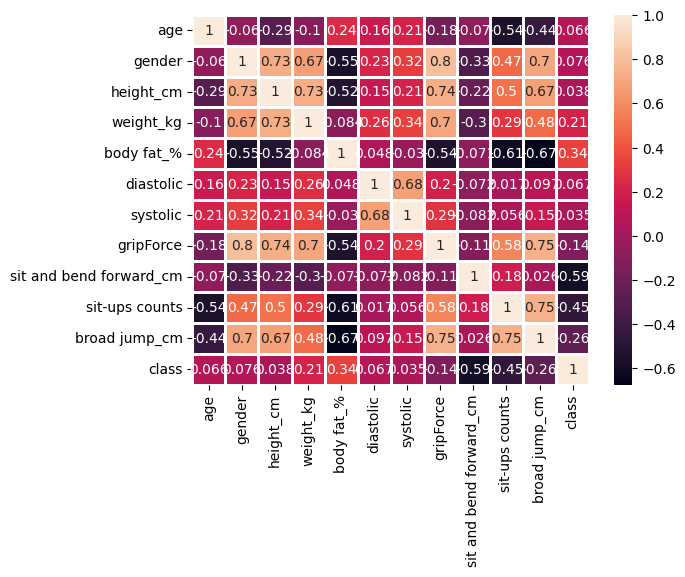

<Figure size 1200x800 with 0 Axes>

In [71]:
#show heatmap for data correlation
#drop string values in the dataset
print(data.corr())
corr_plot = sns.heatmap(data.corr(),annot = True,linewidths=1 )
plt.figure(figsize=(12,8))

plt.show()

In [72]:
#feature selection
featurecols = ['age', 'height_cm', 'weight_kg', 'body fat_%', 'diastolic', 'systolic', 'gripForce', 'sit and bend forward_cm', 'sit-ups counts', 'broad jump_cm']
X = data[featurecols]#feature
y = data['gender']#target Variable


#split the data
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 1)#80% training data and 20% testing



In [73]:
#Iteration 000
#Model Fitting
#initialize the model
clf = DecisionTreeClassifier()
#Train the decision tree classifier with the training and testing sets
clf = clf.fit(X_train, y_train)
#Predict the responses for the trained data
y_pred = clf.predict(X_test)

In [74]:
#Model Evaluation
print("Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Accuracy:  0.9652855543113102


<Axes: >

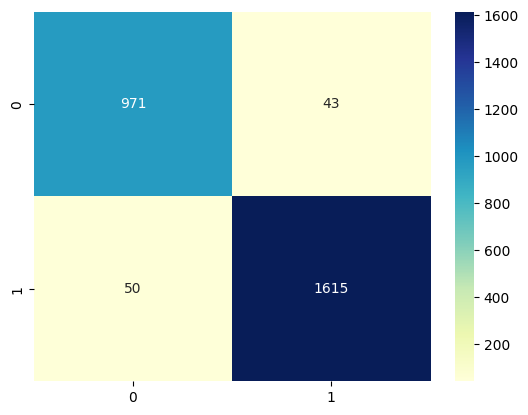

In [75]:
# Iteration 000: confusion matrix

matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(matrix, annot=True, fmt='d', cmap='YlGnBu')

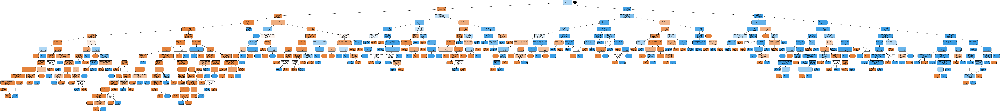

In [76]:
#Visualize the decision tree

dotData = StringIO()
export_graphviz(clf, out_file=dotData, 
                filled=True, rounded=True,
                special_characters=False, feature_names=featurecols)
graph = pydotplus.graph_from_dot_data(dotData.getvalue())
Image(graph.create_png())


In [77]:
#Iteration 001: Do the same thing with an entropy defined
clf = DecisionTreeClassifier(criterion="entropy", max_depth=3)
clf = clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

print("Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Accuracy:  0.9477416946621874


<Axes: >

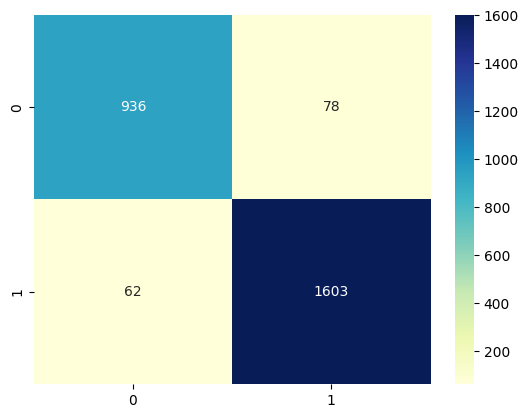

In [78]:
# Iteration 001: confusion matrix

matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(matrix, annot=True, fmt='d', cmap='YlGnBu')

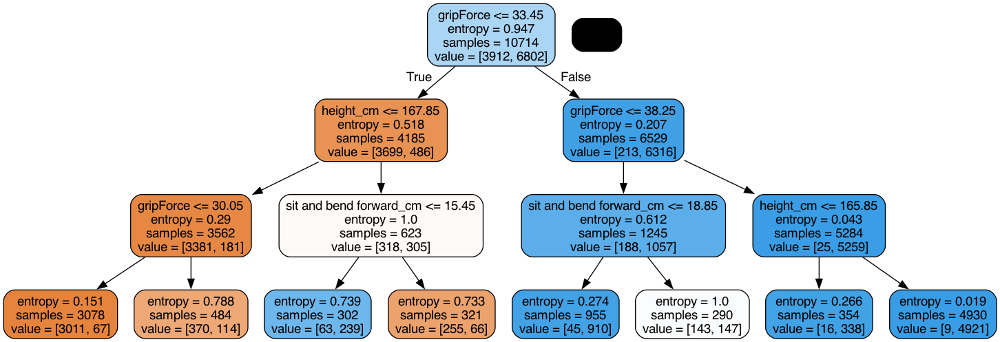

In [79]:
#Visualize the decision tree

dotData = StringIO()
export_graphviz(clf, out_file=dotData, 
                filled=True, rounded=True,
                special_characters=False, feature_names=featurecols)
graph = pydotplus.graph_from_dot_data(dotData.getvalue())
Image(graph.create_png())

In [80]:
#Iteration 002: Creating a decision tree with less data

#Now lets do the same thing but with less data

#split  the data
featurecols = ['age', 'height_cm', 'weight_kg', 'body fat_%']
X = data[featurecols]#feature
y = data['gender']#target Variable

#split the data
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 1)#80% training data and 20% testing

#Model Fitting
#initialize the model
clf = DecisionTreeClassifier()
#Train the decision tree classifier with the training and testing sets
clf = clf.fit(X_train, y_train)
#Predict the responses for the trained data
y_pred = clf.predict(X_test)

#Model Evaluation
print("Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Accuracy:  0.9417693169092946


<Axes: >

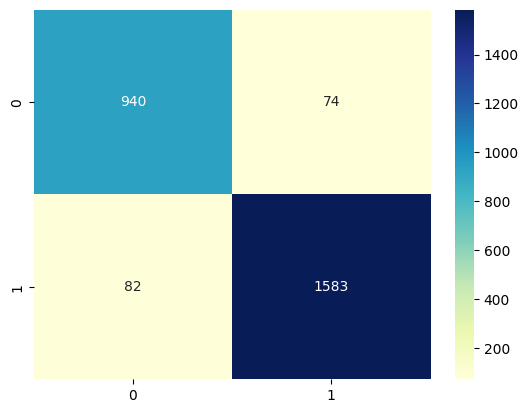

In [81]:
# Iteration 002: confusion matrix

matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(matrix, annot=True, fmt='d', cmap='YlGnBu')

In [82]:
#Visualize the decision tree

dotData = StringIO()
export_graphviz(clf, out_file=dotData, 
                filled=True, rounded=True,
                special_characters=False, feature_names=featurecols)
graph = pydotplus.graph_from_dot_data(dotData.getvalue())
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.924212 to fit



In [83]:
#Iteration 003: Using the shortened data with a defined etnropy as Iteration 001
clf = DecisionTreeClassifier(criterion="entropy", max_depth=3)
clf = clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

print("Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Accuracy:  0.9346771183277343


<Axes: >

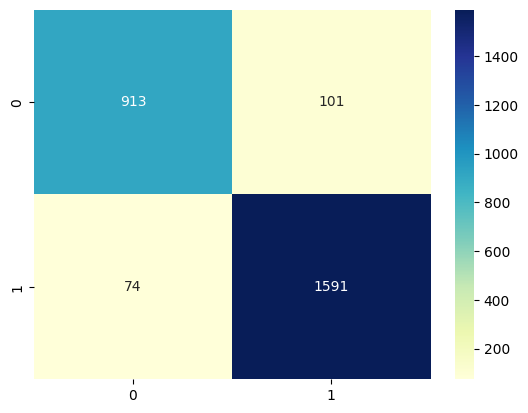

In [84]:
# Iteration 003: confusion matrix

matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(matrix, annot=True, fmt='d', cmap='YlGnBu')

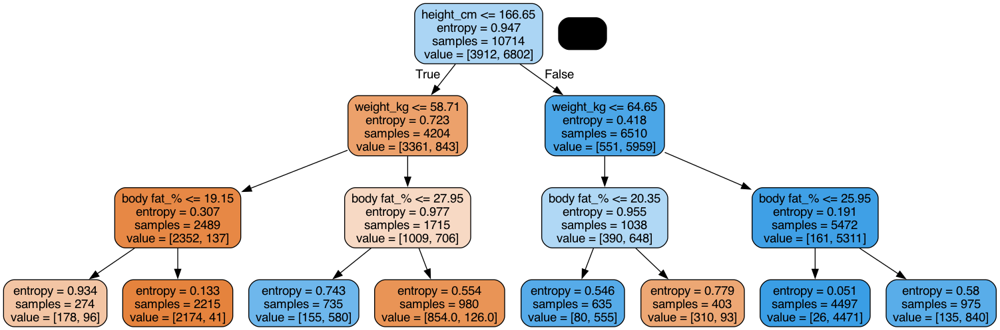

In [85]:
#Visualize the decision tree

dotData = StringIO()
export_graphviz(clf, out_file=dotData, 
                filled=True, rounded=True,
                special_characters=False, feature_names=featurecols)
graph = pydotplus.graph_from_dot_data(dotData.getvalue())
Image(graph.create_png())